In [2]:
#Starting the project
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report 
import os

In [3]:
os.getcwd()

'C:\\Users\\dharm\\Documents\\Mental Health Fitness Tracker'

In [4]:
df=pd.read_csv("mentalsubs.csv")
df2=pd.read_csv("prevelance.csv")

In [5]:
df.head()

,Entity,Code,Year,DALYs (Disability-Adjusted Life Years) - Mental disorders - Sex: Both - Age: All Ages (Percent)
0,Afghanistan,AFG,1990,1.696670
1,Afghanistan,AFG,1991,1.734281
2,Afghanistan,AFG,1992,1.791189
3,Afghanistan,AFG,1993,1.776779
4,Afghanistan,AFG,1994,1.712986


In [6]:
df2.head()

,Entity,Code,Year,Prevalence - Schizophrenia - Sex: Both - Age: Age-standardized (Percent),Prevalence - Bipolar disorder - Sex: Both - Age: Age-standardized (Percent),Prevalence - Eating disorders - Sex: Both - Age: Age-standardized (Percent),Prevalence - Anxiety disorders - Sex: Both - Age: Age-standardized (Percent),Prevalence - Drug use disorders - Sex: Both - Age: Age-standardized (Percent),Prevalence - Depressive disorders - Sex: Both - Age: Age-standardized (Percent),Prevalence - Alcohol use disorders - Sex: Both - Age: Age-standardized (Percent)
0,Afghanistan,AFG,1990,0.228979,0.721207,0.131001,4.835127,0.454202,5.125291,0.444036
1,Afghanistan,AFG,1991,0.228120,0.719952,0.126395,4.821765,0.447112,5.116306,0.444250
2,Afghanistan,AFG,1992,0.227328,0.718418,0.121832,4.801434,0.441190,5.106558,0.445501
3,Afghanistan,AFG,1993,0.226468,0.717452,0.117942,4.789363,0.435581,5.100328,0.445958
4,Afghanistan,AFG,1994,0.225567,0.717012,0.114547,4.784923,0.431822,5.099424,0.445779


In [7]:
#merging both data sets
data = pd.merge(df2,df)

In [8]:
data.head(2)

,Entity,Code,Year,Prevalence - Schizophrenia - Sex: Both - Age: Age-standardized (Percent),Prevalence - Bipolar disorder - Sex: Both - Age: Age-standardized (Percent),Prevalence - Eating disorders - Sex: Both - Age: Age-standardized (Percent),Prevalence - Anxiety disorders - Sex: Both - Age: Age-standardized (Percent),Prevalence - Drug use disorders - Sex: Both - Age: Age-standardized (Percent),Prevalence - Depressive disorders - Sex: Both - Age: Age-standardized (Percent),Prevalence - Alcohol use disorders - Sex: Both - Age: Age-standardized (Percent),DALYs (Disability-Adjusted Life Years) - Mental disorders - Sex: Both - Age: All Ages (Percent)
0,Afghanistan,AFG,1990,0.228979,0.721207,0.131001,4.835127,0.454202,5.125291,0.444036,1.696670
1,Afghanistan,AFG,1991,0.228120,0.719952,0.126395,4.821765,0.447112,5.116306,0.444250,1.734281


In [10]:
data.describe()

,Year,Prevalence - Schizophrenia - Sex: Both - Age: Age-standardized (Percent),Prevalence - Bipolar disorder - Sex: Both - Age: Age-standardized (Percent),Prevalence - Eating disorders - Sex: Both - Age: Age-standardized (Percent),Prevalence - Anxiety disorders - Sex: Both - Age: Age-standardized (Percent),Prevalence - Drug use disorders - Sex: Both - Age: Age-standardized (Percent),Prevalence - Depressive disorders - Sex: Both - Age: Age-standardized (Percent),Prevalence - Alcohol use disorders - Sex: Both - Age: Age-standardized (Percent),DALYs (Disability-Adjusted Life Years) - Mental disorders - Sex: Both - Age: All Ages (Percent)
count,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000
mean,2004.500000,0.281167,0.673891,0.211062,4.327525,0.746708,3.950449,1.578807,4.818062
std,8.656074,0.047561,0.258594,0.152559,1.177961,0.463026,0.921021,0.934655,2.294029
min,1990.000000,0.191621,0.189344,0.045425,1.974823,0.225471,1.640902,0.319900,0.215647
25%,1997.000000,0.255468,0.539791,0.099857,3.567064,0.423502,3.258977,0.732826,3.006507
50%,2004.500000,0.287456,0.591893,0.154143,4.094443,0.646050,3.904117,1.460045,4.679177
75%,2012.000000,0.304760,0.897248,0.276891,4.797286,0.890013,4.550505,2.261262,6.387488
max,2019.000000,0.506018,1.676204,1.136541,9.015948,3.699504,7.688213,4.698694,13.761517


In [9]:
data.shape

(6840, 11)

In [12]:
#cleaning data
data.isnull().sum()

Entity                                                                                               0
Code                                                                                               690
Year                                                                                                 0
Prevalence - Schizophrenia - Sex: Both - Age: Age-standardized (Percent)                             0
Prevalence - Bipolar disorder - Sex: Both - Age: Age-standardized (Percent)                          0
Prevalence - Eating disorders - Sex: Both - Age: Age-standardized (Percent)                          0
Prevalence - Anxiety disorders - Sex: Both - Age: Age-standardized (Percent)                         0
Prevalence - Drug use disorders - Sex: Both - Age: Age-standardized (Percent)                        0
Prevalence - Depressive disorders - Sex: Both - Age: Age-standardized (Percent)                      0
Prevalence - Alcohol use disorders - Sex: Both - Age: Age-standardized (P

In [11]:
data.drop('Code',axis=1,inplace=True)

In [12]:
data.isnull()

,Entity,Year,Prevalence - Schizophrenia - Sex: Both - Age: Age-standardized (Percent),Prevalence - Bipolar disorder - Sex: Both - Age: Age-standardized (Percent),Prevalence - Eating disorders - Sex: Both - Age: Age-standardized (Percent),Prevalence - Anxiety disorders - Sex: Both - Age: Age-standardized (Percent),Prevalence - Drug use disorders - Sex: Both - Age: Age-standardized (Percent),Prevalence - Depressive disorders - Sex: Both - Age: Age-standardized (Percent),Prevalence - Alcohol use disorders - Sex: Both - Age: Age-standardized (Percent),DALYs (Disability-Adjusted Life Years) - Mental disorders - Sex: Both - Age: All Ages (Percent)
0,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...
6835,False,False,False,False,False,False,False,False,False,False
6836,False,False,False,False,False,False,False,False,False,False
6837,False,False,False,False,False,False,False,False,False,False
6838,False,False,False,False,False,False,False,False,False,False


In [17]:
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

In [18]:
import pandas_profiling as pf
display(pf.ProfileReport(data))

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

[]

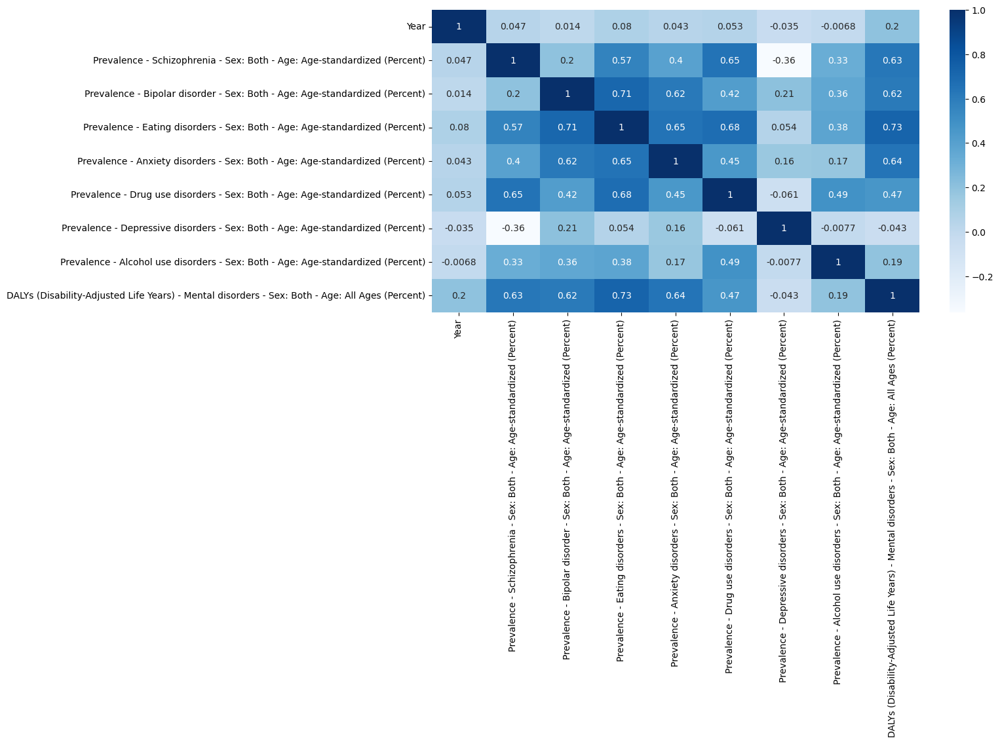

In [19]:
%matplotlib inline
plt.figure(figsize=(12,6))
sns.heatmap(data.corr(),annot=True,cmap='Blues')
plt.plot()

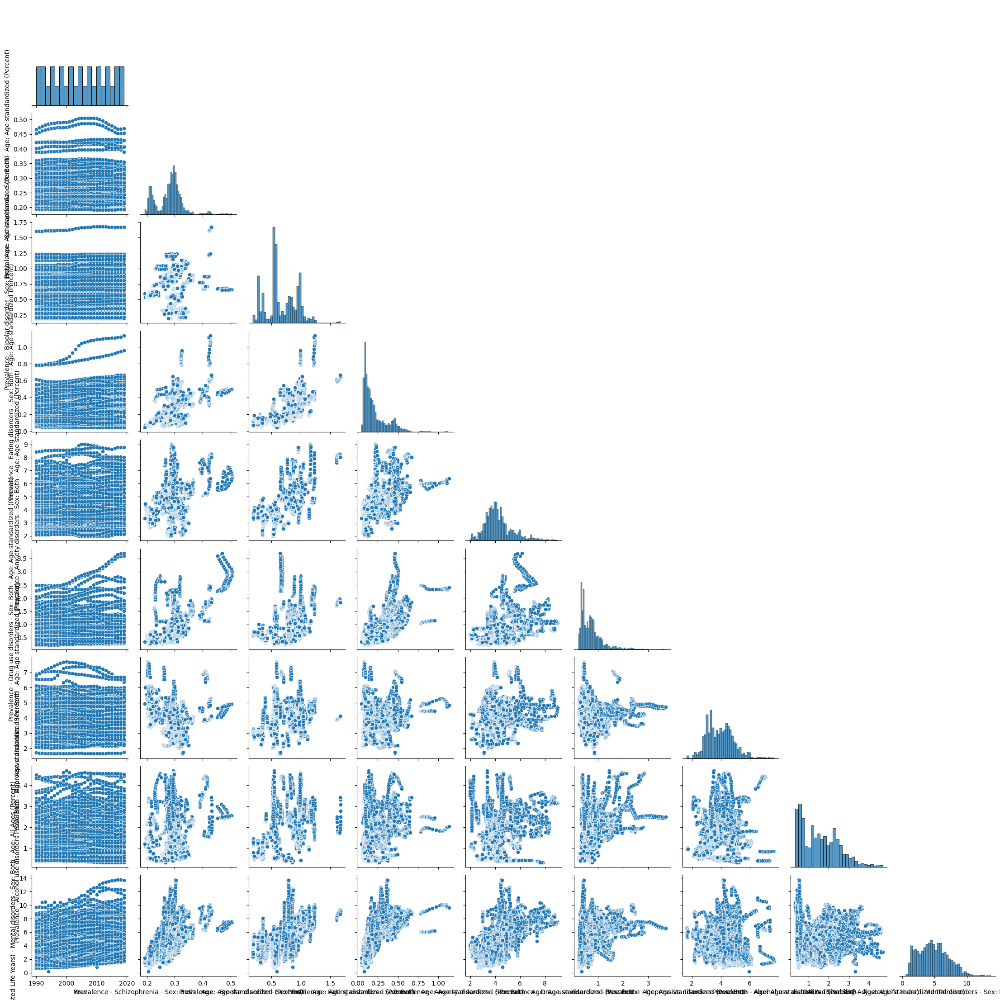

In [20]:
sns.pairplot(data,corner=True)
plt.show()

In [21]:
data.set_axis(['Country','Year','Schizophrenia', 'Bipolar_disorder', 'Eating_disorder','Anxiety','drug_usage','depression','alcohol','mental_fitness'], axis='columns', inplace=True)

In [29]:
fig = px.scatter(data, x='Year', y='depression', size='mental_fitness', color='Country', template='plotly_dark')
fig.show()

In [31]:
fig = px.bar(data, x='Country', y='Bipolar_disorder', color='Year', barmode='group', template='plotly_dark')
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig.show()

In [22]:
fig = px.pie(data, values='mental_fitness', names='Year')
fig.show()

In [23]:
fig=px.bar(data.head(10),x='Year',y='mental_fitness',color='Year',template='ggplot2')
fig.show()

In [24]:
fig = px.line(data, x="Year", y="mental_fitness", color='Country',markers=True,color_discrete_sequence=['red','blue'],template='plotly_dark')
fig.show()

In [27]:
fig = px.bar(data, x='Country', y='Bipolar_disorder', color='Year', barmode='group', template='plotly_dark')
fig.show()

In [32]:
df = data.copy()

In [33]:
df.head()

,Country,Year,Schizophrenia,Bipolar_disorder,Eating_disorder,Anxiety,drug_usage,depression,alcohol,mental_fitness
0,Afghanistan,1990,0.228979,0.721207,0.131001,4.835127,0.454202,5.125291,0.444036,1.696670
1,Afghanistan,1991,0.228120,0.719952,0.126395,4.821765,0.447112,5.116306,0.444250,1.734281
2,Afghanistan,1992,0.227328,0.718418,0.121832,4.801434,0.441190,5.106558,0.445501,1.791189
3,Afghanistan,1993,0.226468,0.717452,0.117942,4.789363,0.435581,5.100328,0.445958,1.776779
4,Afghanistan,1994,0.225567,0.717012,0.114547,4.784923,0.431822,5.099424,0.445779,1.712986


In [34]:
from sklearn.preprocessing import LabelEncoder
l=LabelEncoder()
for i in df.columns:
    if df[i].dtype == 'object':
        df[i]=l.fit_transform(df[i])

In [35]:
#Splitting data frame into train and test
X = df.drop('mental_fitness',axis=1)
Y = df['mental_fitness']

xtrain, xtest, ytrain, ytest = train_test_split(X, Y, test_size=0.2, random_state=2)

In [36]:
#performing linear regression
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
lr = LinearRegression()
lr.fit(xtrain,ytrain)

ytrain_pred = lr.predict(xtrain)
mse = mean_squared_error(ytrain, ytrain_pred)
rmse = (np.sqrt(mean_squared_error(ytrain, ytrain_pred)))
r2 = r2_score(ytrain, ytrain_pred)

print("The model performance for training set")
print("--------------------------------------")
print('MSE is {}'.format(mse))
print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2))
print("\n")

ytest_pred = lr.predict(xtest)
mse = mean_squared_error(ytest, ytest_pred)
rmse = (np.sqrt(mean_squared_error(ytest, ytest_pred)))
r2 = r2_score(ytest, ytest_pred)

print("The model performance for testing set")
print("--------------------------------------")
print('MSE is {}'.format(mse))
print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2))




The model performance for training set
--------------------------------------
MSE is 1.3899593724057981
RMSE is 1.1789653821914357
R2 score is 0.7413245790025274


The model performance for testing set
--------------------------------------
MSE is 1.135754531927241
RMSE is 1.0657178481789826
R2 score is 0.7638974087055268


In [37]:
#Creating a Random Forest Regression
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor()
rf.fit(xtrain, ytrain)
ytrain_pred = rf.predict(xtrain)
mse = mean_squared_error(ytrain, ytrain_pred)
rmse = (np.sqrt(mean_squared_error(ytrain, ytrain_pred)))
r2 = r2_score(ytrain, ytrain_pred)

print("The model performance for training set")
print("--------------------------------------")
print('MSE is {}'.format(mse))
print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2))
print("\n")

ytest_pred = rf.predict(xtest)
mse = mean_squared_error(ytest, ytest_pred)
rmse = (np.sqrt(mean_squared_error(ytest, ytest_pred)))
r2 = r2_score(ytest, ytest_pred)

print("The model performance for testing set")
print("--------------------------------------")
print('MSE is {}'.format(mse))
print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2))

The model performance for training set
--------------------------------------
MSE is 0.004796537712857224
RMSE is 0.06925704089013061
R2 score is 0.999107350591078


The model performance for testing set
--------------------------------------
MSE is 0.030550088551540407
RMSE is 0.17478583624407446
R2 score is 0.9936491954304115


In [42]:
# Calculate the scores of Linear Regression model
lr_scores = lr.score(xtest, ytest)

# Calculate the scores of Random Forest Regressor model
rf_scores = rf.score(xtest, ytest)

print("Evaluation of Models")
print("---------------------")
print("Linear Regression Score: {:.2f}".format(lr_scores))
print("Random Forest Regressor Score: {:.2f}".format(rf_scores))

Evaluation of Models
---------------------
Linear Regression Score: 0.76
Random Forest Regressor Score: 0.99


In [39]:
print("Welcome to Mental Fitness Tracker!\nFill the detail to check your mental fitness!")
country= l.fit_transform([input('Enter Your country Name:')])
year= int(input("Enter the Year:"))
schi= (float(input("Enter your Schizophrenia rate in %:")))
bipo_dis= (float(input("Enter your Bipolar disorder rate in %:")))
eat_dis= (float(input("Enter your Eating disorder rate in %:")))
anx= (float(input("Enter your Anxiety rate in %:")))
drug_use= (float(input("Enter your Drug Usage rate in per year %:")))
depr= (float(input("Enter your Depression rate in %:")))
alch= (float(input("Enter your Alcohol Consuming rate per year in %:")))


prediction= rf.predict([[country,year,schi,bipo_dis,eat_dis,anx,drug_use,depr,alch]])
print("Your Mental Fitness is {}%".format(prediction*10))

Welcome to Mental Fitness Tracker!
Fill the detail to check your mental fitness!
Enter Your country Name:china
Enter the Year:2012
Enter your Schizophrenia rate in %:12
Enter your Bipolar disorder rate in %:1
Enter your Eating disorder rate in %:45
Enter your Anxiety rate in %:7
Enter your Drug Usage rate in per year %:3
Enter your Depression rate in %:12
Enter your Alcohol Consuming rate per year in %:12
Your Mental Fitness is [90.71448643]%


In [ ]:
#Here You can clearly see the Random Forest Regressor has an accuracy of almost 100% which means the prediction,
#given by it would be almost accurate.
#Thank You
#Vishesh Joshi
#visheshjoshi78@gmail.com